In [27]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np


<class 'scipy.sparse._csr.csr_matrix'>
vocabulary =  {'myogiadityanath': 1812, 'savesoil': 2360, 'culmination': 664, 'of': 1907, 'illegal': 1330, 'drug': 845, 'trade': 2739, 'is': 1428, 'as': 262, 'important': 1348, 'culminating': 663, 'guns': 1186, 'from': 1096, 'peaceful': 2017, 'huma': 1304, 'life': 1581, 'it': 1434, 'helped': 1247, 'gun': 1185, 'ransoms': 2205, 'amp': 214, 'abductions': 82, 'killings': 1509, 'terrorism': 2642, 'abuse': 97, 'created': 644, 'mental': 1727, 'disorders': 801, 'training': 2745, 'in': 1350, 'madrassas': 1658, 'children': 497, 'to': 2710, 'have': 1222, 'be': 327, 'suicide': 2580, 'bombers': 382, 'https': 1299, 'co': 538, '4zhe80bauw': 41, 'provinceharare': 2159, 'health': 1232, 'day': 698, 'commemorations': 551, 'topics': 2725, 'discussed': 794, 'prevention': 2114, 'importance': 1347, 'gbv': 1119, 'substance': 2570, 'road': 2313, 'traffic': 2741, 'safety': 2345, 'giving': 1142, 'talk': 2618, 'on': 1926, 'awareness': 296, 'and': 216, 'at': 279, 'mua': 1799

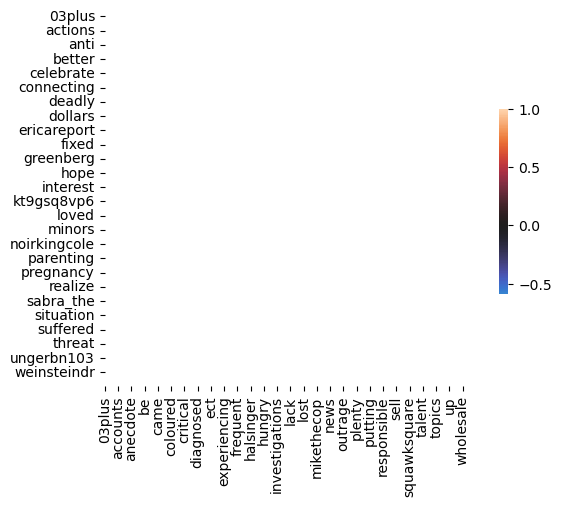

In [32]:
df1 = pd.read_csv('../../data/api data/drug abuse mental.csv')
pd.options.display.max_colwidth = 200 

corpus = df1['full_text']
vectorizer=CountVectorizer()   
Xs  =  vectorizer.fit_transform(corpus)   
print(type(Xs))

### EXPLORE THE OBJECT ATTRIBUTES 

# VOCABULARY DICTIONARY
print("vocabulary = ",vectorizer.vocabulary_)   

# STOP WORDS 
print("stop words =", vectorizer.stop_words)

# col_names
col_names=vectorizer.get_feature_names_out()
print("col_names=",col_names)

# X  =  vectorizer.fit_transform(corpus)   --> returns a SPARSE document term frequency matrix
print("SPARSE MATRIX\n",Xs)

#CONVERT TO DENSE MATRIX
X=np.array(Xs.todense())
print("CORPUS=",corpus)
print("COLUMN NAMES=",col_names)
print("DOCUMENT WORD COUNTS")
print("SPARSE MATRIX\n",X)   

print("COLUMN NAMES=",col_names)
print("CORPUS WIDE WORD COUNTS:",np.sum(X,axis=0))
print("WORDS PER DOCUMENT:\n",np.sum(X,axis=1))

#CONVERT DOCUMENT TERM FREQUENCY TO ONE HOT ENCODED VECTORS
maxs=np.max(X,axis=0)
ONE_HOT_ENCODED=np.ceil(X/maxs)
print("MAX COUNT:",maxs)
print("ONE_HOT_ENCODED")
print(ONE_HOT_ENCODED)

#------------------------
# #COMPUTE PAIRWISE DISTANCES BETWEEN DOCUMENTS 
#------------------------

print("--------------------------------------------")
#LOOP OVER ROWS (DOCUMENTS)
for i in range(0,X.shape[0]):
    # for j in range(i+1,len(X)):
    for j in range(i,X.shape[0]):
        print("DOC-i=",i,"DOC-j=",j); #print(X[i,:]); print(X[j,:])
        print("     CARTESIAN:",(np.sum((X[i,:]-X[j,:])**2.0)**0.5))

        #CARTESIAN DISTANCE
        CS=np.dot(X[i,:],X[j,:])/np.linalg.norm(X[i,:])/np.linalg.norm(X[j,:])
        print("     COSINE SIMILARITY:",CS)
        print("     COSINE DISTANCE:",1.0-CS)
print("--------------------------------------------")

#------------------------
#PANDAS AND SEABORN STUFF
#------------------------
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

noise=np.random.uniform(0,0.00001,X.shape) 

df=pd.DataFrame(noise+X, columns=col_names)
#REORDER FROM MOST FREQUENT WORD IN CORPUS TO LEAST
# MAX_WORD=min(len(SORTED_COL_NAME),5)
# df=df[SORTED_COL_NAME[0:MAX_WORD]]
print(df)

print(df.describe())
corr=df.corr()
print("CORR=",corr)

# sns.pairplot(df, diag_kind='kde', kind="hist")  # SLOWER
# plt.show()

# # Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()
